In [ ]:
!sudo add-apt-repository -y ppa:alessandro-strada/ppa 2>&1 > /dev/null
!sudo apt-get update -qq 2>&1 > /dev/null
!sudo apt -y install -qq google-drive-ocamlfuse 2>&1 > /dev/null
!google-drive-ocamlfuse



debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl5/Debconf/FrontEnd/Dialog.pm line 76, <> line 1.)
debconf: falling back to frontend: Readline
debconf: unable to initialize frontend: Readline
debconf: (This frontend requires a controlling tty.)
debconf: falling back to frontend: Teletype
dpkg-preconfigure: unable to re-open stdin: 
/usr/bin/xdg-open: 869: www-browser: not found
/usr/bin/xdg-open: 869: links2: not found
/usr/bin/xdg-open: 869: elinks: not found
/usr/bin/xdg-open: 869: links: not found
/usr/bin/xdg-open: 869: lynx: not found
/usr/bin/xdg-open: 869: w3m: not found
xdg-open: no method available for opening 'https://accounts.google.com/o/oauth2/auth?client_id=564921029129.apps.googleusercontent.com&redirect_uri=https%3A%2F%2Fgd-ocaml-auth.appspot.com%2Foauth2callback&scope=https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive&response_type=code&access_type=offline&

In [ ]:
!sudo apt-get install -qq w3m # to act as web browser 
!xdg-settings set default-web-browser w3m.desktop # to set default browser
%cd /content
!mkdir drive
%cd drive
!mkdir MyDrive
%cd ..
%cd ..
!google-drive-ocamlfuse /content/drive/MyDrive

debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl5/Debconf/FrontEnd/Dialog.pm line 76, <> line 1.)
debconf: falling back to frontend: Readline
debconf: unable to initialize frontend: Readline
debconf: (This frontend requires a controlling tty.)
debconf: falling back to frontend: Teletype
dpkg-preconfigure: unable to re-open stdin: 
Selecting previously unselected package w3m.
(Reading database ... 122523 files and directories currently installed.)
Preparing to unpack .../w3m_0.5.3-37ubuntu0.1_amd64.deb ...
Unpacking w3m (0.5.3-37ubuntu0.1) ...
Setting up w3m (0.5.3-37ubuntu0.1) ...
Processing triggers for man-db (2.9.1-1) ...
Processing triggers for mime-support (3.64ubuntu1) ...
/content
/content/drive
/content
/
Access token retrieved correctly.


In [2]:
import os
import pickle
import numpy as np
from tqdm.notebook import tqdm
from tensorflow.keras.applications.vgg19 import VGG19, preprocess_input
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Model
from tensorflow.keras.utils import to_categorical, plot_model
from tensorflow.keras.layers import Input, Dense, LSTM, GRU, Embedding, Dropout, add
import tensorflow as tf

 
BASE_DIR = '/content/drive/MyDrive/dataset'
WORKING_DIR = '/content/drive/MyDrive/IMAGE CAPTIONING'

In [3]:
from tensorflow.keras.applications.inception_v3 import InceptionV3, preprocess_input

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
%cd ../../../

/


In [ ]:
!pwd

/


In [5]:
model = tf.keras.applications.InceptionV3(
    include_top=False,
    weights="imagenet",
    input_shape=(224,224,3),
    pooling='avg',
)

87910968/87910968 [==============================] - 0s 0us/step


In [ ]:
model.summary()

Model: "inception_v3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 111, 111, 32  864         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 111, 111, 32  96         ['conv2d[0][0]']                 
 alization)                     )                                                      

In [ ]:
# extract features from image
features = {}
directory =BASE_DIR +'/Images'
print(directory)
#directory = os.path.join(BASE_DIR, 'Images')

for img_name in tqdm(os.listdir(directory)):
    # load the image from file
    img_path = directory + '/' + img_name
    image = load_img(img_path, target_size=(224, 224))
    # convert image pixels to numpy array
    image = img_to_array(image)
    # reshape data for model
    image = image.reshape((1, image.shape[0], image.shape[1], image.shape[2]))
    # preprocess image for vgg
    image = preprocess_input(image)
    # extract features
    feature = model.predict(image, verbose=0)
    # get image ID
    image_id = img_name.split('.')[0]
    # store feature
    features[image_id] = feature

/content/drive/MyDrive/Automatic Scene Description Generation/main/data/Images


  0%|          | 0/8091 [00:00<?, ?it/s]

In [ ]:
len(features)

In [ ]:
features['641893280_36fd6e886a'].shape

In [ ]:
# store features in pickle
pickle.dump(features, open(os.path.join(WORKING_DIR, 'features_inceptionv3.pkl'), 'wb'))

In [ ]:
del features

In [7]:
# load features from pickle
with open(os.path.join(WORKING_DIR, 'features_inceptionv3.pkl'), 'rb') as f:
    features = pickle.load(f)

In [8]:
features['405051459_3b3a3ba5b3'][0].shape

(2048,)

In [9]:
with open(os.path.join(BASE_DIR, 'captions.txt'), 'r') as f:
    next(f)
    captions_doc = f.read()

In [10]:
# create mapping of image to captions
mapping = {}
# process lines
for line in tqdm(captions_doc.split('\n')):
    # split the line by comma(,)
    tokens = line.split(',')
    if len(line) < 2:
        continue
    image_id, caption = tokens[0], tokens[1:]
    # remove extension from image ID
    image_id = image_id.split('.')[0]
    # convert caption list to string
    caption = " ".join(caption)
    # create list if needed
    if image_id not in mapping:
        mapping[image_id] = []
    # store the caption
    mapping[image_id].append(caption)

  0%|          | 0/40456 [00:00<?, ?it/s]

In [11]:
len(mapping)

8091

In [12]:
def clean(mapping):
    for key, captions in mapping.items():
        for i in range(len(captions)):
            # take one caption at a time
            caption = captions[i]
            # preprocessing steps
            # convert to lowercase
            caption = caption.lower()
            # delete digits, special chars, etc., 
            caption = caption.replace('[^A-Za-z]', '')
            # delete additional spaces
            caption = caption.replace('\s+', ' ')
            # add start and end tags to the caption
            caption = 'startseq ' + " ".join([word for word in caption.split() if len(word)>1]) + ' endseq'
            captions[i] = caption

In [13]:
# before preprocess of text
mapping['1000268201_693b08cb0e']


['A child in a pink dress is climbing up a set of stairs in an entry way .',
 'A girl going into a wooden building .',
 'A little girl climbing into a wooden playhouse .',
 'A little girl climbing the stairs to her playhouse .',
 'A little girl in a pink dress going into a wooden cabin .']

In [15]:
# preprocess the text
clean(mapping)

In [16]:
mapping['1000268201_693b08cb0e']

['startseq startseq child in pink dress is climbing up set of stairs in an entry way endseq endseq',
 'startseq startseq girl going into wooden building endseq endseq',
 'startseq startseq little girl climbing into wooden playhouse endseq endseq',
 'startseq startseq little girl climbing the stairs to her playhouse endseq endseq',
 'startseq startseq little girl in pink dress going into wooden cabin endseq endseq']

In [17]:
all_captions = []
for key in mapping:
    for caption in mapping[key]:
        all_captions.append(caption)

In [18]:
len(all_captions)

40455

In [19]:
all_captions[:10]

['startseq startseq child in pink dress is climbing up set of stairs in an entry way endseq endseq',
 'startseq startseq girl going into wooden building endseq endseq',
 'startseq startseq little girl climbing into wooden playhouse endseq endseq',
 'startseq startseq little girl climbing the stairs to her playhouse endseq endseq',
 'startseq startseq little girl in pink dress going into wooden cabin endseq endseq',
 'startseq startseq black dog and spotted dog are fighting endseq endseq',
 'startseq startseq black dog and tri-colored dog playing with each other on the road endseq endseq',
 'startseq startseq black dog and white dog with brown spots are staring at each other in the street endseq endseq',
 'startseq startseq two dogs of different breeds looking at each other on the road endseq endseq',
 'startseq startseq two dogs on pavement moving toward each other endseq endseq']

In [20]:
# tokenize the text
tokenizer = Tokenizer()
tokenizer.fit_on_texts(all_captions)
vocab_size = len(tokenizer.word_index) + 1

In [21]:
vocab_size

8485

In [22]:
# get maximum length of the caption available
max_length = max(len(caption.split()) for caption in all_captions)
max_length

37

In [23]:
image_ids = list(mapping.keys())
split = int(len(image_ids) * 0.90)
train = image_ids[:split]
test = image_ids[split:]

In [24]:
# create data generator to get data in batch (avoids session crash)
def data_generator(data_keys, mapping, features, tokenizer, max_length, vocab_size, batch_size):
    # loop over images
    X1, X2, y = list(), list(), list()
    n = 0
    while 1:
        for key in data_keys:
            n += 1
            captions = mapping[key]
            # process each caption
            for caption in captions:
                # encode the sequence
                seq = tokenizer.texts_to_sequences([caption])[0]
                # split the sequence into X, y pairs
                for i in range(1, len(seq)):
                    # split into input and output pairs
                    in_seq, out_seq = seq[:i], seq[i]
                    # pad input sequence
                    in_seq = pad_sequences([in_seq], maxlen=max_length)[0]
                    # encode output sequence
                    out_seq = to_categorical([out_seq], num_classes=vocab_size)[0]
                    
                    # store the sequences
                    X1.append(features[key][0])
                    X2.append(in_seq)
                    y.append(out_seq)
            if n == batch_size:
                X1, X2, y = np.array(X1), np.array(X2), np.array(y)
                yield [X1, X2], y
                X1, X2, y = list(), list(), list()
                n = 0

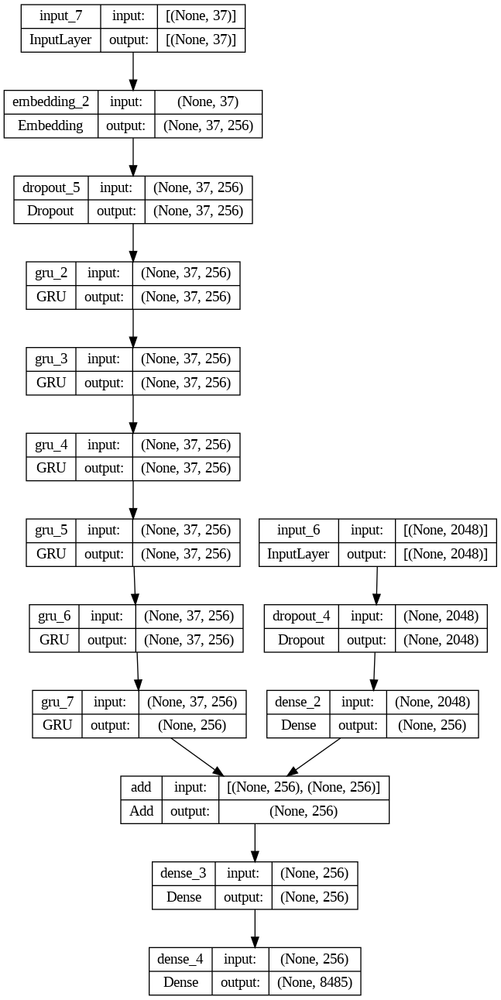

In [27]:
# encoder model
# image feature layers
inputs1 = Input(shape=(2048,))
fe1 = Dropout(0.4)(inputs1)
fe2 = Dense(256, activation='relu')(fe1)

# sequence feature layers
inputs2 = Input(shape=(max_length,))
se1 = Embedding(vocab_size, 256, mask_zero=True)(inputs2)
se2 = Dropout(0.4)(se1)
se3 = GRU(256, return_sequences=True)(se2)
se4 = GRU(256, return_sequences=True)(se3)
se5 = GRU(256, return_sequences=True)(se4)
se6 = GRU(256, return_sequences=True)(se5)
se7 = GRU(256, return_sequences=True)(se6)
se8 = GRU(256)(se7)

# decoder model
decoder1 = add([fe2, se8])
decoder2 = Dense(256, activation='relu')(decoder1)
outputs = Dense(vocab_size, activation='softmax')(decoder2)

model = Model(inputs=[inputs1, inputs2], outputs=outputs)
model.compile(loss='categorical_crossentropy', optimizer='adam')

# plot the model
plot_model(model, show_shapes=True)

In [ ]:
checkpoint_filepath = WORKING_DIR+'/best_simple_model.h5'
model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_filepath,
    monitor='loss',
    mode='min',
    save_best_only=True)

In [ ]:
# train the model
epochs = 50
batch_size = 32
steps = len(train) // batch_size

for i in range(epochs):
    # create data generator
    generator = data_generator(train, mapping, features, tokenizer, max_length, vocab_size, batch_size)
    # fit for one epoch
    model.fit(generator, epochs=1, steps_per_epoch=steps, verbose=1, callbacks=[model_checkpoint_callback])

 26/227 [==>...........................] - ETA: 1:29 - loss: 2.0795

In [ ]:
# save the model
model.save(WORKING_DIR+'/best_model.h5')

In [ ]:
model = tf.keras.models.load_model(WORKING_DIR+'/best_simple_model.h5')

In [ ]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 35)]         0           []                               
                                                                                                  
 input_1 (InputLayer)           [(None, 2048)]       0           []                               
                                                                                                  
 embedding (Embedding)          (None, 35, 256)      2172160     ['input_2[0][0]']                
                                                                                                  
 dropout (Dropout)              (None, 2048)         0           ['input_1[0][0]']                
                                                                                              

In [ ]:
def idx_to_word(integer, tokenizer):
    for word, index in tokenizer.word_index.items():
        if index == integer:
            return word
    return None

In [ ]:
# generate caption for an image
def predict_caption(model, image, tokenizer, max_length):
    # add start tag for generation process
    in_text = 'startseq'
    # iterate over the max length of sequence
    for i in range(max_length):
        # encode input sequence
        sequence = tokenizer.texts_to_sequences([in_text])[0]
        # pad the sequence
        sequence = pad_sequences([sequence], max_length)
        # predict next word
        yhat = model.predict([image, sequence], verbose=0)
        # get index with high probability
        yhat = np.argmax(yhat)
        # convert index to word
        word = idx_to_word(yhat, tokenizer)
        # stop if word not found
        if word is None:
            break
        # append word as input for generating next word
        in_text += " " + word
        # stop if we reach end tag
        if word == 'endseq':
            break
      
    return in_text

In [ ]:
from nltk.translate.bleu_score import corpus_bleu
# validate with test data
actual, predicted = list(), list()

for key in tqdm(test):
    # get actual caption
    captions = mapping[key]
    # predict the caption for image
    y_pred = predict_caption(model, features[key], tokenizer, max_length) 
    # split into words
    actual_captions = [caption.split() for caption in captions]
    y_pred = y_pred.split()
    # append to the list
    actual.append(actual_captions)
    predicted.append(y_pred)
    
# calcuate BLEU score
print("BLEU-1: %f" % corpus_bleu(actual, predicted, weights=(1.0, 0, 0, 0)))
print("BLEU-2: %f" % corpus_bleu(actual, predicted, weights=(0.5, 0.5, 0, 0)))

  0%|          | 0/810 [00:00<?, ?it/s]

BLEU-1: 0.502919
BLEU-2: 0.269854


In [ ]:
len(actual)

810

In [ ]:
len(predicted)

810

In [ ]:
predicted[0]

['startseq',
 'man',
 'in',
 'red',
 'jacket',
 'is',
 'standing',
 'on',
 'ladder',
 'endseq']

In [ ]:
!pip  install sacrebleu

!pip3 install datasets

import datasets
from datasets import load_metric

In [ ]:
bleu=load_metric("bleu")
#predictions=[["I",'have','30','years']]
predictions = predicted
references = actual
bleu.compute(predictions=predictions,references=references)

<ipython-input-59-d568c77adc56>:1: FutureWarning: load_metric is deprecated and will be removed in the next major version of datasets. Use 'evaluate.load' instead, from the new library 🤗 Evaluate: https://huggingface.co/docs/evaluate
  bleu=load_metric("bleu")


{'bleu': 0.08960830020757223,
 'precisions': [0.5045177045177045,
  0.14525745257452574,
  0.054490106544901065,
  0.016145833333333335],
 'brevity_penalty': 1.0,
 'length_ratio': 1.2431693989071038,
 'translation_length': 8190,
 'reference_length': 6588}

In [ ]:
from PIL import Image
import matplotlib.pyplot as plt
def generate_caption(image_name):
    # load the image
    # image_name = "1001773457_577c3a7d70.jpg"
    image_id = image_name.split('.')[0]
    img_path = os.path.join(BASE_DIR, "Images", image_name)
    image = Image.open(img_path)
    captions = mapping[image_id]
    print('---------------------Actual---------------------')
    for caption in captions:
      print(caption)
    # predict the caption
    y_pred = predict_caption(model, features[image_id], tokenizer, max_length)
    print('--------------------Predicted--------------------')
    print(y_pred)
    plt.imshow(image)

---------------------Actual---------------------
startseq black dog and spotted dog are fighting endseq
startseq black dog and tri-colored dog playing with each other on the road endseq
startseq black dog and white dog with brown spots are staring at each other in the street endseq
startseq two dogs of different breeds looking at each other on the road endseq
startseq two dogs on pavement moving toward each other endseq
--------------------Predicted--------------------
startseq two dogs are playing in the snow endseq


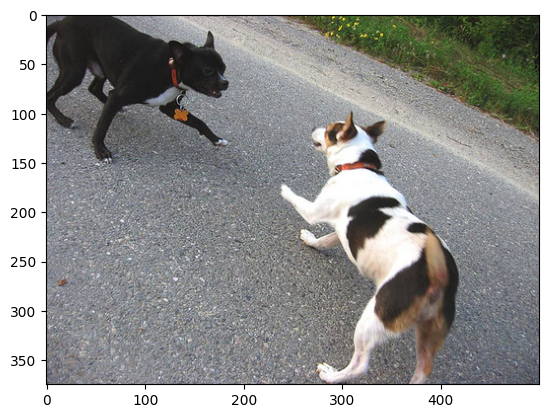

In [ ]:
generate_caption("1001773457_577c3a7d70.jpg")

---------------------Actual---------------------
startseq group of mountain bikers race each other down dirt hill endseq
startseq group of people do tricks on motorbikes endseq
startseq dirt bikers riding off jump endseq
startseq four motorcycle racers are on dirt track endseq
startseq four motorcycles are racing on dirt track endseq
--------------------Predicted--------------------
startseq man riding dirt bike endseq


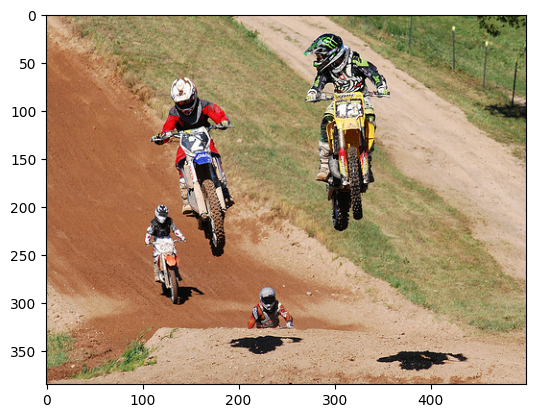

In [ ]:
generate_caption("3717309680_e5105afa6d.jpg")

---------------------Actual---------------------
startseq "a black and brown dog runs along the sand avoiding an oncoming wave ." endseq
startseq dog is running parallel with the ocean waves endseq
startseq dog running in the surf endseq
startseq dog runs on the shore endseq
startseq the dog runs next to the crashing waves of the ocean endseq
--------------------Predicted--------------------
startseq dog running through the snow endseq


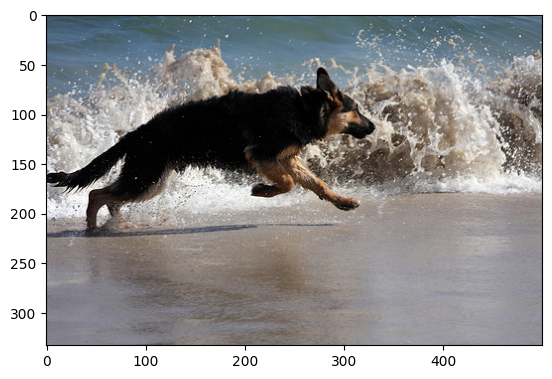

In [ ]:
generate_caption("3704431444_f337ec2b90.jpg")

---------------------Actual---------------------
startseq girls fighting on karate competition endseq
startseq two girls are kicking each other in martial arts uniforms endseq
startseq two people are performing karate at tournament endseq
startseq two woman are doing karate endseq
startseq two women in their karate uniforms kick at one another endseq
--------------------Predicted--------------------
startseq two men in karate uniforms are fighting in home endseq


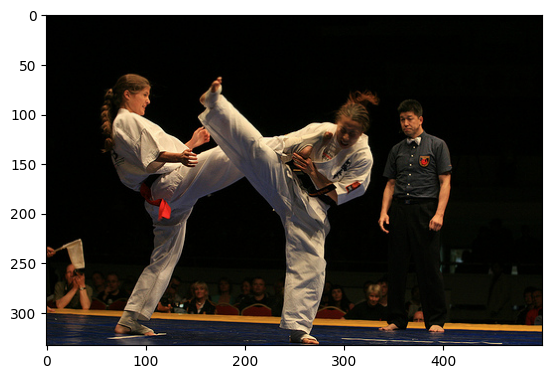

In [ ]:
generate_caption("3697456750_460aea7252.jpg")

---------------------Actual---------------------
startseq four wheel drive car is navigating along rocky off road trail endseq
startseq jeep sidewalks on some rocks endseq
startseq red jeep hangs from the edge of rocky cliff as girl looks on endseq
startseq red truck is driving over rocky surface endseq
startseq woman stands next to red suv that has run off into ditch endseq
--------------------Predicted--------------------
startseq jeep sidewalks on some rocks endseq


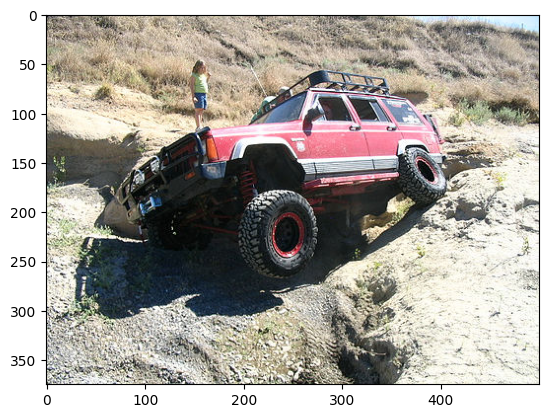

In [ ]:
generate_caption("36422830_55c844bc2d.jpg")

---------------------Actual---------------------
startseq man in pink shirt and white vest plays guitar endseq
startseq man in pink shirt playing guitar endseq
startseq man in white suit and pink shirt plays guitar endseq
startseq man wearing pants plays guitar while onstage endseq
startseq the man in the white and pink outfit is holding guitar endseq
--------------------Predicted--------------------
startseq man wearing black shirt and cap is raising his hand endseq


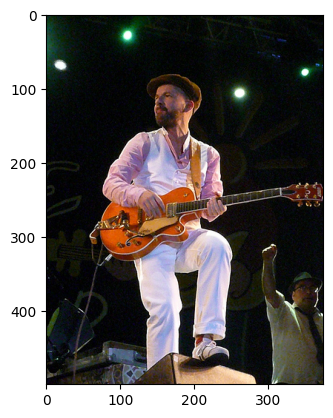

In [ ]:
generate_caption("3723690961_729dd5d617.jpg")

---------------------Actual---------------------
startseq civil war reenactment with cannon teams firing cannons endseq
startseq group of men firing an old fashion cannon endseq
startseq recreation of some battle endseq
startseq sveral men participating in civil war reenactment endseq
startseq war reenactors fire cannon endseq
--------------------Predicted--------------------
startseq group of people riding double on atv 's endseq


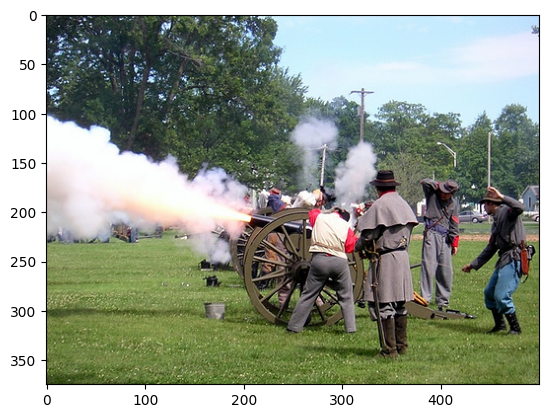

In [ ]:
generate_caption("61209225_8512e1dad5.jpg")

---------------------Actual---------------------
startseq group of people are sitting around campfire at night endseq
startseq group of people sitting on the grass by fire at nighttime endseq
startseq group of young people are sitting around fire pit endseq
startseq friends enjoy campfire endseq
startseq several people sitting around campfire endseq
--------------------Predicted--------------------
startseq two people sit on tram during the nighttime endseq


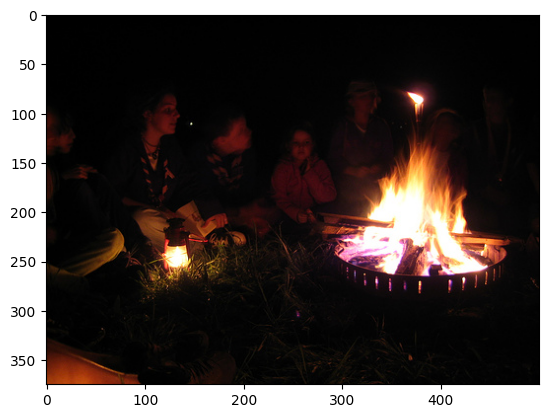

In [ ]:
generate_caption("69710411_2cf537f61f.jpg")

---------------------Actual---------------------
startseq woman dressed in blue jacket and blue jeans rides brown horse near frozen lake and snow-covered mountain endseq
startseq woman in blue jacket rides brown pony near water endseq
startseq woman rides horse near frozen lake in the wintertime endseq
startseq young blond woman sitting atop brown draft horse in the snowy mountains endseq
startseq woman blue jacket sits on daft horse near frozen lake endseq
--------------------Predicted--------------------
startseq two dogs are running in the snow endseq


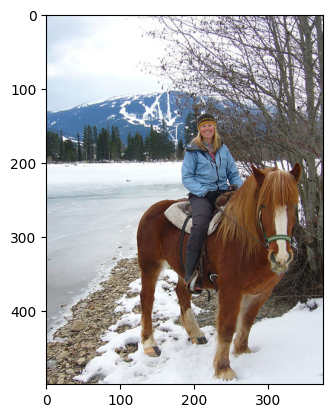

In [ ]:
generate_caption("109202756_b97fcdc62c.jpg")

---------------------Actual---------------------
startseq people on atvs and dirt bikes are traveling along worn path in field surrounded by trees endseq
startseq three people are riding around on atv 's and motorcycles endseq
startseq three people on motorbikes follow trail through dry grass endseq
startseq three people on two dirt-bikes and one four-wheeler are riding through brown grass endseq
startseq three people ride off-road bikes through field surrounded by trees endseq
--------------------Predicted--------------------
startseq man riding four wheeler off dirt hill endseq


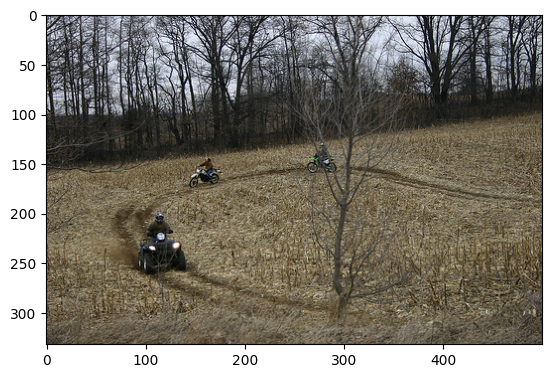

In [ ]:
generate_caption("112243673_fd68255217.jpg")

---------------------Actual---------------------
startseq boy and three girls in blue school uniforms walk down dirt-covered road endseq
startseq group of children in blue uniforms walk to class endseq
startseq four children in uniforms stand in front of palm trees endseq
startseq four teens in school uniforms walk down tropical road endseq
startseq group of school children in blue school uniforms endseq
--------------------Predicted--------------------
startseq woman and her child walk on dirt road endseq


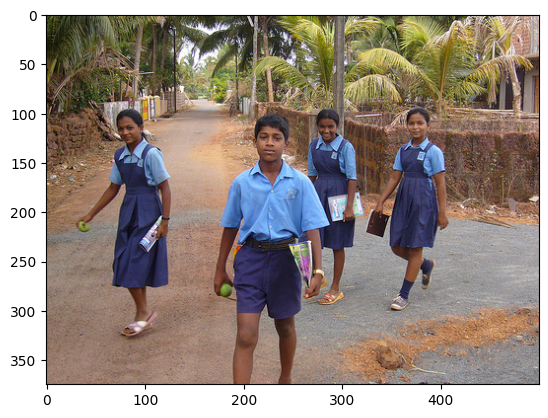

In [ ]:
generate_caption("146098876_0d99d7fb98.jpg")

---------------------Actual---------------------
startseq "a black station wagon with its lights on partially submerged in water with wooded area behind it ." endseq
startseq car is partially submerged in lake endseq
startseq car is sinking underwater in lake or river endseq
startseq toyota car drives into water endseq
startseq the four wheel drive car is driving through river endseq
--------------------Predicted--------------------
startseq jeep is driving through mud puddle endseq


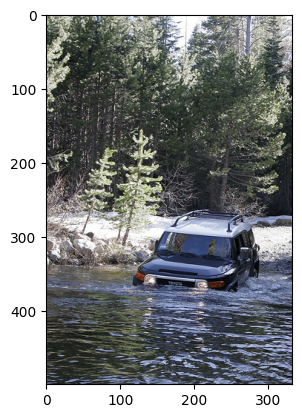

In [ ]:
generate_caption("160585932_fa6339f248.jpg")

---------------------Actual---------------------
startseq blonde horse and blonde girl in black sweatshirt are staring at fire in barrel endseq
startseq girl and her horse stand by fire endseq
startseq girl holding horse 's lead behind fire endseq
startseq "a man and girl and two horses are near contained fire ." endseq
startseq two people and two horses watching fire endseq
--------------------Predicted--------------------
startseq two dogs are riding on leashes in the grass endseq


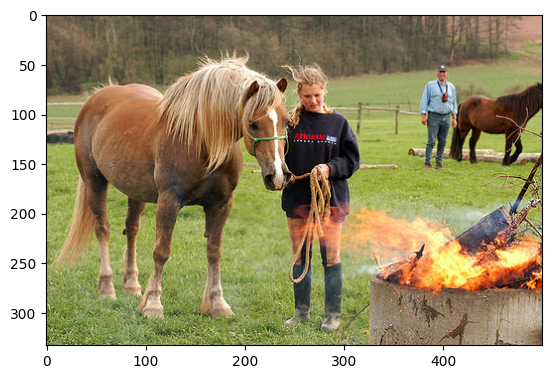

In [ ]:
generate_caption("10815824_2997e03d76.jpg")

---------------------Actual---------------------
startseq brown dog is sprayed with water endseq
startseq dog is being squirted with water in the face outdoors endseq
startseq dog stands on his hind feet and catches stream of water endseq
startseq jug is jumping up it is being squirted with jet of water endseq
startseq "a tan male dog is jumping up to get drink of water from spraying bottle ." endseq
--------------------Predicted--------------------
startseq dog is sprayed by hose endseq


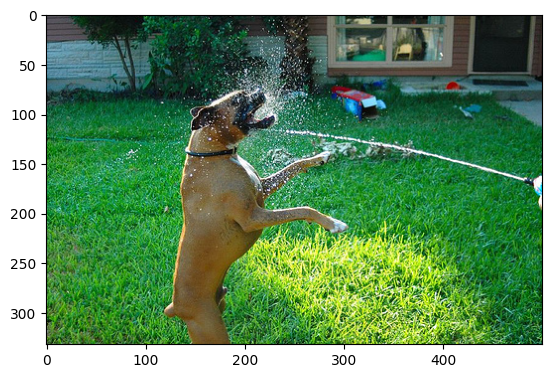

In [ ]:
generate_caption("44856031_0d82c2c7d1.jpg")

---------------------Actual---------------------
startseq soccer player in blue is chasing after the player in black and white endseq
startseq the girl in the white strip is falling down as the girl in the blue strip challenges for the soccer ball endseq
startseq the girls are playing soccer endseq
startseq two women in soccer uniforms playing soccer endseq
startseq two young women on different teams are playing soccer on field endseq
--------------------Predicted--------------------
startseq two men are playing cricket endseq


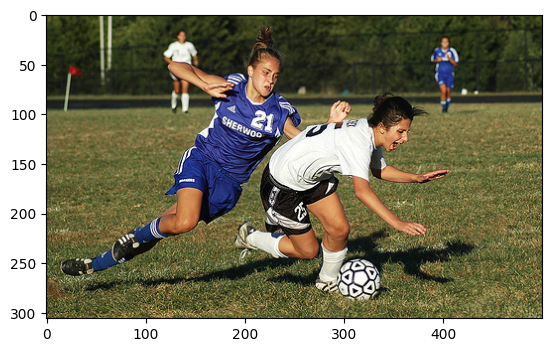

In [ ]:
generate_caption("47871819_db55ac4699.jpg")

---------------------Actual---------------------
startseq group of eight people are gathered around table at night endseq
startseq group of people gathered around in the dark endseq
startseq group of people sit around table outside on porch at night endseq
startseq group of people sit outdoors together at night endseq
startseq group of people sitting at table in darkened room endseq
--------------------Predicted--------------------
startseq man sits at desk reading against fruit display endseq


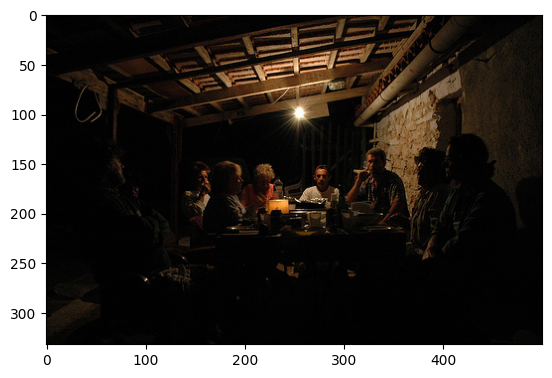

In [ ]:
generate_caption("107582366_d86f2d3347.jpg")

---------------------Actual---------------------
startseq boy in yellow shorts is standing on top of cliff endseq
startseq boy wearing blue and yellow walking on cliff edge endseq
startseq little boy standing high in the air on rock endseq
startseq young child is standing alone on some jagged rocks endseq
startseq child stands near edge of cliff endseq
--------------------Predicted--------------------
startseq man is riding bike on dirt road endseq


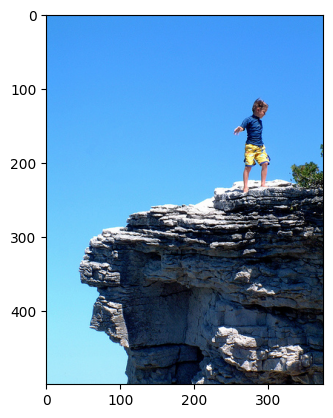

In [ ]:
generate_caption("109671650_f7bbc297fa.jpg")

---------------------Actual---------------------
startseq parents are pushing little children in red car carts endseq
startseq twin boys being pushed in small car shaped strollers in parade endseq
startseq twin toddlers dressed alike being pushed in plastic car strollers in parade endseq
startseq two children ride in toy cars endseq
startseq two kids being pushed in car shaped strollers in parade endseq
--------------------Predicted--------------------
startseq two women in black are sitting on bench endseq


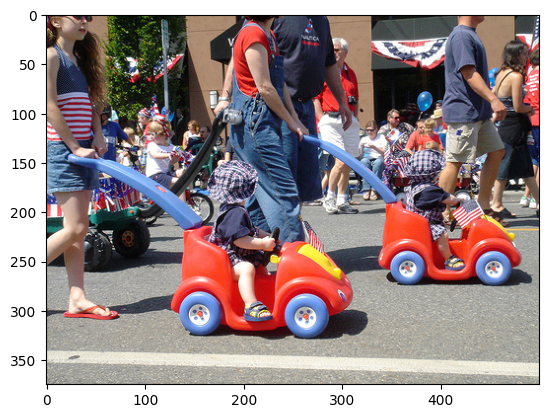

In [ ]:
generate_caption("118187095_d422383c81.jpg")

---------------------Actual---------------------
startseq boy hits baseball with the bat endseq
startseq "a boy swings baseball bat and catcher stands behind him ." endseq
startseq kid hits baseball during game endseq
startseq little boy in teal uniform swinging baseball bat endseq
startseq the boy in the blue shirt is swinging baseball bat towards ball as the boy in the red helmet waits to catch him out endseq
--------------------Predicted--------------------
startseq man in red shirt and blue shorts raising his waist to throw basket endseq


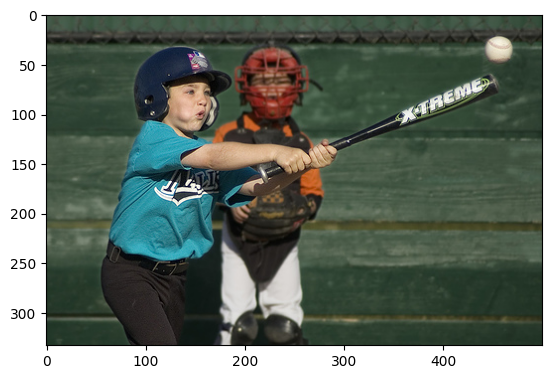

In [ ]:
generate_caption("141139674_246c0f90a1.jpg")

---------------------Actual---------------------
startseq man and woman are at catered dinner getting food endseq
startseq an asian couple dip their plates at buffet endseq
startseq young man and young woman serve food endseq
startseq girl and boy serving food on plate endseq
startseq two young people serve food endseq
--------------------Predicted--------------------
startseq man sits on bench in library endseq


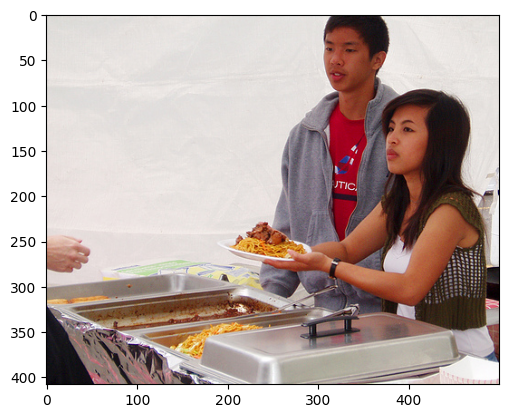

In [ ]:
generate_caption("141755292_7a0b3364cf.jpg")

---------------------Actual---------------------
startseq girl wearing pink hoodie looks through her camera endseq
startseq woman in pink taking picture endseq
startseq woman takes picture during the day endseq
startseq young woman in pink hoodie takes picture endseq
startseq woman with red curly hair taking pictures outside endseq
--------------------Predicted--------------------
startseq two girls are sitting on the ground endseq


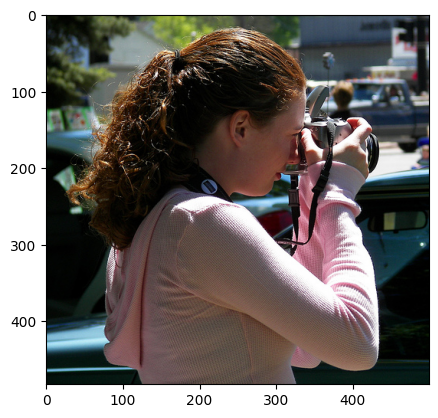

In [ ]:
generate_caption("150582765_bad8dec237.jpg")

---------------------Actual---------------------
startseq woman is walking past an artificial waterfall endseq
startseq woman is walking with someone else beside pond in the city endseq
startseq woman talking on cellphone walking in front of water endseq
startseq woman walks by river across city buildings endseq
startseq young woman in city park near water feature endseq
--------------------Predicted--------------------
startseq seven people are paddling the pond endseq


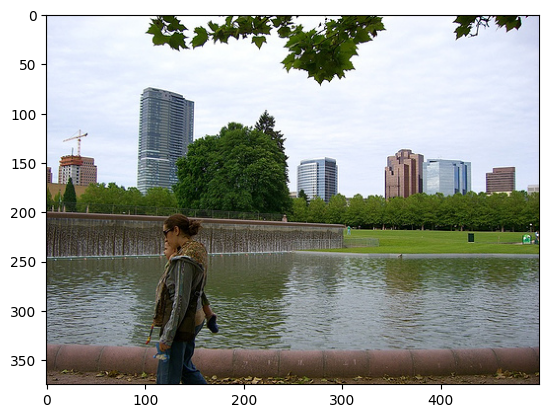

In [ ]:
generate_caption("159712188_d530dd478c.jpg")

---------------------Actual---------------------
startseq competitive motorcycle racer prepares to make left turn along paved road endseq
startseq man rides motorcycle with the number on it endseq
startseq motorcycle driver swerves to the left endseq
startseq motorcycle with number five on front is being ridden by rider wearing red helmet endseq
startseq professional motorcycle racer turning corner endseq
--------------------Predicted--------------------
startseq person riding motorcycle while wearing red and red outfit endseq


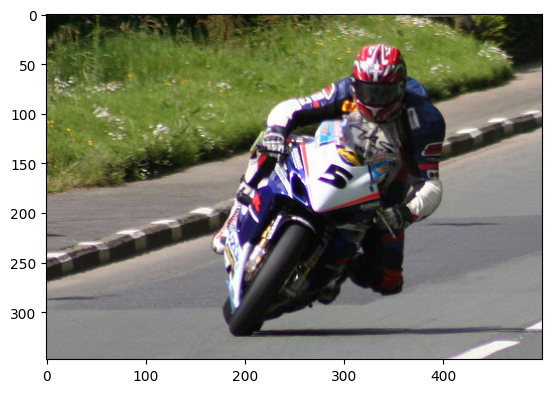

In [ ]:
generate_caption("161669933_3e7d8c7e2c.jpg")

---------------------Actual---------------------
startseq group of race buggies travel down racetrack endseq
startseq cars racing on dirt track endseq
startseq race cars are racing each other on dirt racetrack and the green one is in the lead endseq
startseq ralley cars muscle for position on dirt track endseq
startseq two lines of colorful cars racing on racetrack endseq
--------------------Predicted--------------------
startseq race cars racing around racetrack endseq


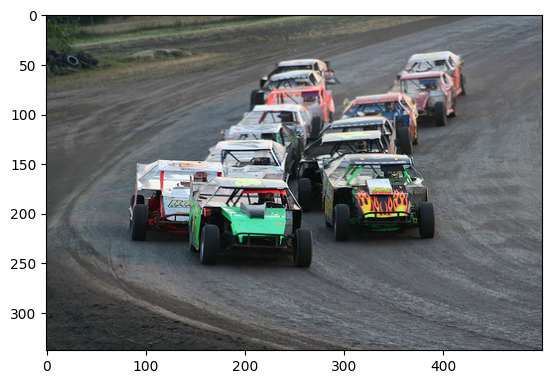

In [ ]:
generate_caption("166654939_80ea4ddbcc.jpg")

In [ ]:
feature_model = tf.keras.applications.ResNet50V2(
    include_top=False,
    weights="imagenet",
    input_shape=(224,224,3),
    pooling='max'
)

from PIL import Image
import matplotlib.pyplot as plt
def generate_caption_own_image(image_name):
    # load the image
    # image_name = "1001773457_577c3a7d70.jpg"
    image_path=BASE_DIR + '/test/' + image_name
    # load image
    image = load_img(image_path, target_size=(224, 224))
    # convert image pixels to numpy array
    image = img_to_array(image)
    # reshape data for model
    image = image.reshape((1, image.shape[0], image.shape[1], image.shape[2]))
    # preprocess image for vgg
    image = preprocess_input(image)
    # extract features
    feature = feature_model.predict(image, verbose=0)
    # predict from the trained model
    cap = predict_caption(model, feature, tokenizer, max_length)
    image = Image.open(image_path)
    plt.imshow(image)
    print(cap+'\n')

94668760/94668760 [==============================] - 5s 0us/step


startseq two girls are playing baseball endseq



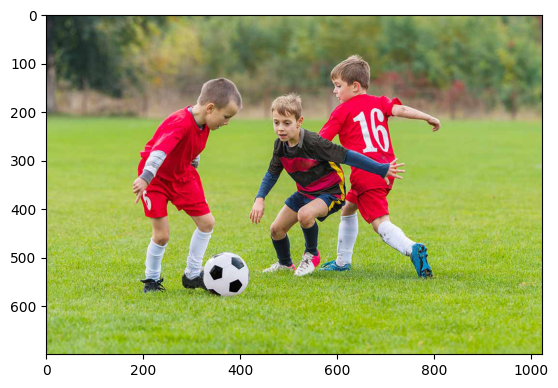

In [ ]:
generate_caption_own_image('football.jpeg')

startseq man in blue shirt and jeans is riding bike endseq



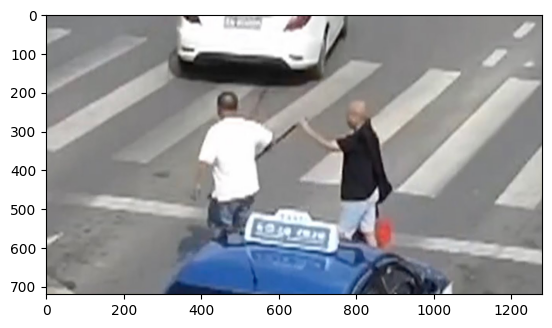

In [ ]:
generate_caption_own_image('blindperson.jpg')

startseq group of people wearing bright colors are riding bikes on the street endseq



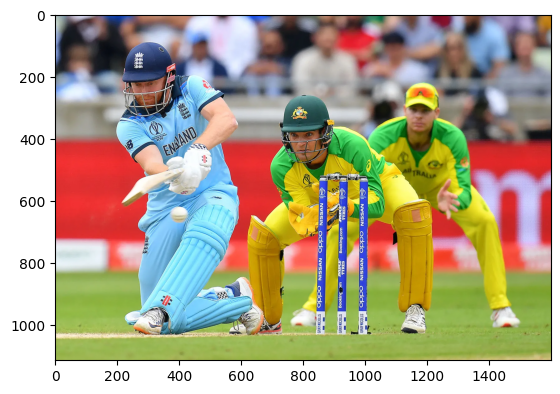

In [ ]:
generate_caption_own_image('cricket.jpg')

startseq racks of plants is being perused by shoppers in fruit lit greenhouse endseq



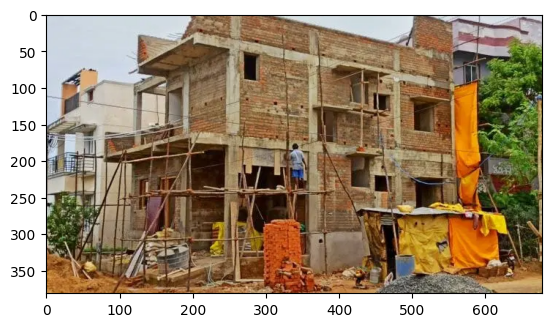

In [ ]:
generate_caption_own_image('construction.webp')

startseq people shop for fresh produce at the stage endseq



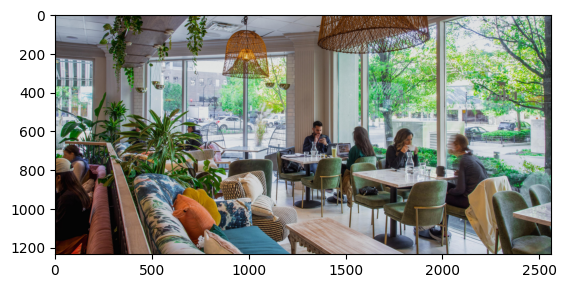

In [ ]:
generate_caption_own_image('coffeeshop.jpeg')

startseq man climbs up rock wall endseq



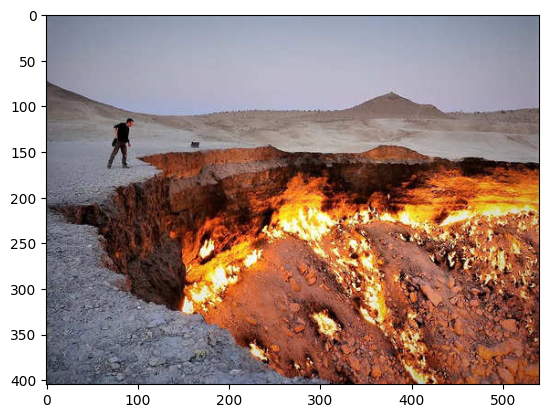

In [ ]:
generate_caption_own_image('dangerousplace.jpg')

startseq two dogs are playing in the snow endseq



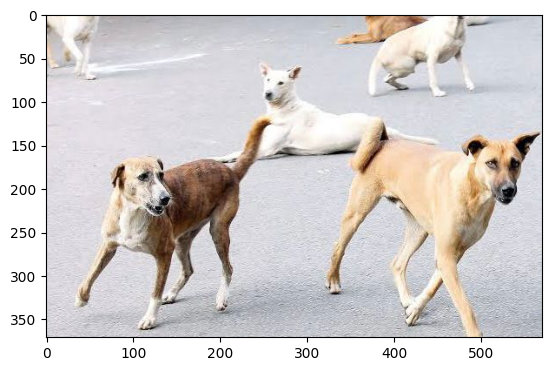

In [ ]:
generate_caption_own_image('dogs.jpg')

startseq boy skateboards down the stairs endseq



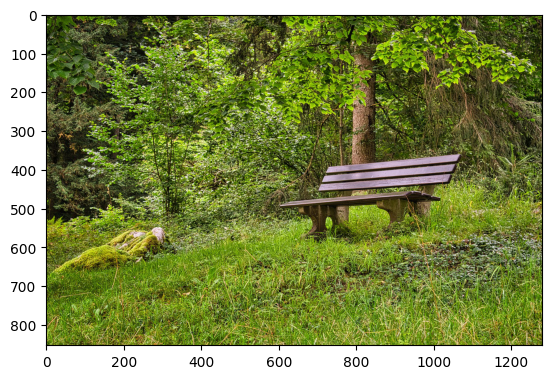

In [ ]:
generate_caption_own_image('woodenbench.jpg')